In [1]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# maybe adapt system paths and pickle version
import sys
import pickle

import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pypsa
import matplotlib.colors as mplcolors
from matplotlib.gridspec import GridSpec
from matplotlib import rc
rc('text', usetex=False) 

import statsmodels.api as sm
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier, RadiusNeighborsClassifier

#from palettable.cmocean.sequential import Solar_3
#date_string = datetime.datetime.now().strftime("%I_%M_%B_%d")

path = '/media/fkaiser/'

#sys.path.append(path+'Code/power-system-split/power_system_split/')
sys.path.append('../power_system_split/')
#sys.path.append('./')
import utils,visualisation

# Load network and parameters

#### https://jugit.fz-juelich.de/network-science-group/power-system-split/-/blob/master/notebooks/evaluate_component_cluster.ipynb

In [3]:
path_to_pypsa_network   = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'
results_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/Results/'

criterion = 'nodes' # or 'load'
snet_index = 0 # only AC grid of CE
co2ls = np.arange(0.0,0.99,0.05)


In [4]:
# the graph G should be independent of co2l right? so that we can load it out of the loop!?
network = pypsa.Network()
network.import_from_netcdf(path_to_pypsa_network+'elec_s_800_ec_lv1.0_Co2L0.5-3H.nc') # +year+'/elec_s_306_ec_lv1.0_1H.nc')#
G = utils.build_networkx_graph(network, snet_index = snet_index)

/home/jkruse/.conda/envs/system_split/lib/python3.8/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/jkruse/.conda/envs/system_split/lib/python3.8/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.5-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


In [5]:
bridges = list(nx.bridges(nx.Graph(G)))
non_bridges = list(set(list(G.edges())) - set(bridges))
n_initial_failures = len(non_bridges)
n_time_stamps = network.snapshots.size

number_of_simulations = n_initial_failures*n_time_stamps

# Evaluate cluster and component properties

In [14]:
# Add component properties
component_props.loc[:,'rocof'] = component_props.load_imbalance / component_props.inertia_proxy*50/2/6
component_props.loc[:, 'number_of_nodes'] = indicator_vectors.sum(1)
component_props.loc[:,'inertia_proxy'] = component_props.inertia_proxy


# Construct cluster properties and add likelihood of cluster given a certain co2 level
# (Likelihood = Prob. that split of this cluster occurs at random time and initial failure)
cluster_props = component_props.groupby(['cluster_label','co2l']).size().to_frame('counts')
cluster_props.loc[:,'likelihood'] = cluster_props.counts.div(number_of_simulations)
cluster_props.loc[:,'mean_number_of_nodes'] = component_props.groupby(['cluster_label','co2l'])['number_of_nodes'].mean()

# Count infinity rocofs and then set them no nan in component properties
cluster_props.loc[:,'number_pos_inf_rocofs'] = component_props.groupby(['cluster_label','co2l']).apply(lambda x: np.isposinf(x.rocof).sum())
cluster_props.loc[:,'number_neg_inf_rocofs'] = component_props.groupby(['cluster_label','co2l']).apply(lambda x: np.isneginf(x.rocof).sum())
component_props.loc[:,'rocof'] = component_props.loc[:,'rocof'].replace([np.inf, -np.inf], np.nan).dropna()

cluster_props.loc[:,'median_inertia_proxy'] = component_props.groupby(['cluster_label','co2l'])['inertia_proxy'].median()
cluster_props.loc[:,'upper_quantile_inertia_proxy'] = component_props.groupby(['cluster_label','co2l'])['inertia_proxy'].quantile(0.75)
cluster_props.loc[:,'lower_quantile_inertia_proxy'] = component_props.groupby(['cluster_label','co2l'])['inertia_proxy'].quantile(0.25)

# Calculate rocof statistics for each cluster given a certain co2 level
cluster_props.loc[:,'median_rocof'] = component_props.groupby(['cluster_label','co2l'])['rocof'].median()
cluster_props.loc[:,'median_pos_rocof'] = component_props[component_props.rocof>0].groupby(['cluster_label','co2l'])['rocof'].median()
cluster_props.loc[:,'mean_pos_rocof'] = (component_props[component_props.rocof>0].groupby(['cluster_label','co2l'])['rocof']).apply(lambda g: g.mean(skipna=False))
cluster_props.loc[:,'min_pos_rocof'] = component_props[component_props.rocof>0].groupby(['cluster_label','co2l'])['rocof'].quantile(0.05) #.min()
cluster_props.loc[:,'max_pos_rocof'] = component_props[component_props.rocof>0].groupby(['cluster_label','co2l'])['rocof'].quantile(0.95) #.max()
cluster_props.loc[:,'median_neg_rocof'] = component_props[component_props.rocof<=0].groupby(['cluster_label','co2l'])['rocof'].median().abs()
cluster_props.loc[:,'upper_quantile_neg_rocof'] = component_props[component_props.rocof<=0].groupby(['cluster_label','co2l'])['rocof'].quantile(0.75).abs()
cluster_props.loc[:,'lower_quantile_neg_rocof'] = component_props[component_props.rocof<=0].groupby(['cluster_label','co2l'])['rocof'].quantile(0.25).abs()

cluster_props.loc[:,'mean_neg_rocof'] = component_props[component_props.rocof<=0].groupby(['cluster_label','co2l'])['rocof'].apply(lambda g: g.mean(skipna=False)).abs()
cluster_props.loc[:,'max_neg_rocof'] = component_props[component_props.rocof<=0].groupby(['cluster_label','co2l'])['rocof'].quantile(0.05).abs() #min()
cluster_props.loc[:,'min_neg_rocof'] = component_props[component_props.rocof<=0].groupby(['cluster_label','co2l'])['rocof'].quantile(0.95).abs() #max()

# convert rocof to absolute rocof and save sign
#component_props.loc[:,'rocof_positive'] = component_props.loc[:,'rocof']>0
#component_props.loc[:,'rocof'] = component_props.loc[:,'rocof'].abs()

# this DataFrame has a Multiindex (cluster_label, co2l)
cluster_props.head()

counts  likelihood  mean_number_of_nodes  \
cluster_label co2l                                             
-1.0          0.00     913    0.000327            333.841183   
              0.05     551    0.000197            361.448276   
              0.10     373    0.000134            333.262735   
              0.15     258    0.000092            343.922481   
              0.20     233    0.000083            350.167382   

                    number_pos_inf_rocofs  number_neg_inf_rocofs  \
cluster_label co2l                                                 
-1.0          0.00                     30                      0   
              0.05                     13                      0   
              0.10                     14                      0   
              0.15                      1                      0   
              0.20                      4                      0   

                    median_inertia_proxy  upper_quantile_inertia_proxy  \
cluster_label co2l                                                       
-1.0          0.00          41884.754579                  62163.666948   
              0.05          50707.598779                  78811.291609   
              0.10          49530.206900                  87160.054956   
              0.15          60041.986253                 108156.459760   
              0.20          66928.693969                 125270.173707   

                    lower_quantile_inertia_proxy  median_rocof  \
cluster_label co2l                                               
-1.0          0.00                   2359.000000     -0.012104   
              0.05                   9700.351461     -0.497608   
              0.10                   3423.500000     -0.465361   
              0.15                  14788.470817     -0.365343   
              0.20                  27213.003803     -0.265220   

                    median_pos_rocof  mean_pos_rocof  min_pos_rocof  \
cluster_label co2l                                                    
-1.0          0.00         12.778933     1145.798850       0.365937   
              0.05          7.132473      392.373664       0.474953   
              0.10         10.103190      347.664988       0.403575   
              0.15          4.159726      185.069516       0.222423   
              0.20          2.944269      170.026846       0.329044   

                    max_pos_rocof  median_neg_rocof  upper_quantile_neg_rocof  \
cluster_label co2l                                                              
-1.0          0.00    2275.029669          1.082454                  0.529382   
              0.05    3544.869394          0.917282                  0.507940   
              0.10    2842.575595          0.900597                  0.491472   
              0.15    1419.065152          0.685309                  0.396722   
              0.20    1281.655394          0.503236                  0.284085   

                    lower_quantile_neg_rocof  mean_neg_rocof  max_neg_rocof  \
cluster_label co2l                                                            
-1.0          0.00                  1.665225        8.613172      28.432737   
              0.05                  1.653843        8.362572      12.864649   
              0.10                  1.521969       12.092572      27.176491   
              0.15                  1.496627       11.785902      15.512132   
              0.20                  1.009632        0.984305       3.435378   

                    min_neg_rocof  
cluster_label co2l                 
-1.0          0.00       0.037814  
              0.05       0.115652  
              0.10       0.083624  
              0.15       0.030157  
              0.20       0.083643

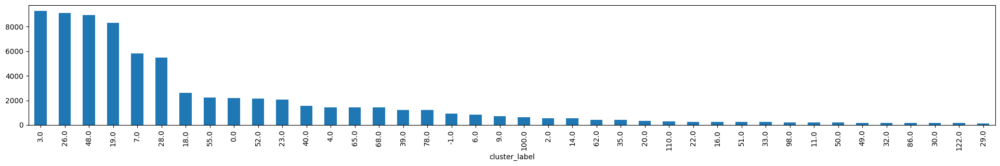

In [15]:
cluster_props.groupby('cluster_label').apply(lambda x: x.counts.max()).sort_values().iloc[::-1].iloc[:40].plot.bar(figsize=(24,3),
                                                                                                                   subplots=False)
plt.show()
# check how fast cluster probabilities decrease and for how much cases the selected ones account for

In [39]:
 # Only select cluster if there is at least one co2l with P(cluster | co2l) significantly larger than p (alpha=0.05)
# (i.e. we omit very unlikely clusters)
p = 0.0004
min_count, max_counts = sm.stats.binom_test_reject_interval(p,number_of_simulations, alternative='larger', alpha=0.05)
print('Rejected if less than', int(max_counts), 'hits in all', number_of_simulations, 'simulations')

#selected_cluster = cluster_props.index[cluster_props.counts>max_counts]
#n_selected_cluster = selected_cluster.get_level_values('cluster_label').unique().size

selected_cluster_mask = cluster_props.groupby('cluster_label').apply(lambda x: (x.counts>max_counts).any())
selected_cluster = selected_cluster_mask[selected_cluster_mask].index
selected_cluster = cluster_props.loc[selected_cluster].groupby('cluster_label').apply(lambda x: x.counts.max()).sort_values().index[::-1]
n_selected_cluster = selected_cluster.size

print('Labels of selected cluster:', selected_cluster)
print('Number of selected cluster:', n_selected_cluster)

Rejected if less than 1173 hits in all 2791520 simulations
Labels of selected cluster: Float64Index([ 3.0, 26.0, 48.0, 19.0,  7.0, 28.0, 18.0, 55.0,  0.0, 52.0, 23.0,
              40.0,  4.0, 68.0, 65.0, 39.0, 78.0],
             dtype='float64', name='cluster_label')
Number of selected cluster: 17


# Visualize results

## Plot cluster

In [ ]:
# Plot mean component vector of selected (cluster, co2l) samples
# (Does this make sense to only average over selected tuples?)

n_cols = 3 # adapt this value!

n_rows = np.ceil(n_selected_cluster/n_cols).astype(int)
fig,ax = plt.subplots(n_rows,n_cols,figsize = (15,4*n_rows))

#selected_components_mask = pd.MultiIndex.from_frame(component_props.loc[:,['cluster_label', 'co2l']]).isin(selected_cluster)
#selected_cluster_labels = component_props[selected_components_mask].cluster_label
#selected_ind_vectors = indicator_vectors[selected_components_mask]

selected_ind_vectors = indicator_vectors[component_props.cluster_label.isin(selected_cluster)]
selected_cluster_labels = component_props[component_props.cluster_label.isin(selected_cluster)].cluster_label
selected_cluster_props = cluster_props.loc[:,['likelihood', 'counts']].groupby('cluster_label').sum()
selected_cluster_props = selected_cluster_props[selected_cluster_props.index.isin(selected_cluster_labels)]

visualisation.plot_component_cluster(selected_ind_vectors,
                                     ax.flatten()[:n_selected_cluster],
                                     selected_cluster_labels.values,
                                     selected_cluster_props,
                                     G)
plt.show()

## Plot cluster properties

<Figure size 640x480 with 0 Axes>

<Figure size 1100x2500 with 0 Axes>

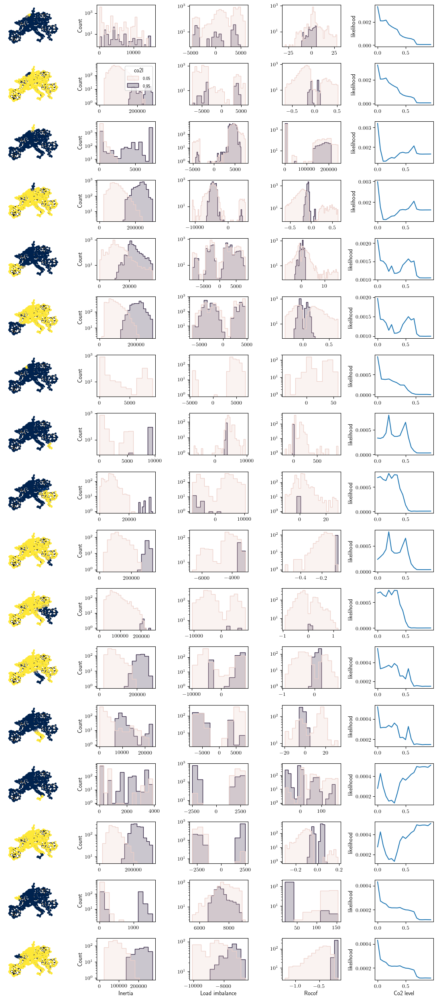

In [42]:

plt.clf()
n_col = 5
co2l_colors = plt.get_cmap('cividis')(range(co2ls.size))
fig, ax = plt.subplots(n_selected_cluster, n_col, figsize=(11,25))

for ax_row, label in enumerate(selected_cluster):
    
    
    # split map
    visualisation.plot_component_cluster(indicator_vectors[component_props.cluster_label==label],
                                         [ax[ax_row, 0]],
                                         component_props[component_props.cluster_label==label].cluster_label.values,
                                         '',
                                         G,
                                         5)
    
    data = component_props[(component_props.cluster_label==label) & (component_props.co2l.isin([0.05, 0.95]))  ]
    nbins = 'scott' #data.groupby('co2l').size() // 50
       
    # inertia
    gfg = sns.histplot(data=data,
                 x='inertia_proxy', hue='co2l', ax=ax[ax_row, 1],
                 bins=nbins ,
                 legend=(ax_row==1),element="step",  fill=True, log_scale=(False, True),
                 binrange=[0, data.groupby('co2l').inertia_proxy.quantile(0.99).max()])
    ax[ax_row, 1].set_xlabel('')
    if ax_row==1:
        plt.setp(gfg.get_legend().get_texts(), fontsize=7)
        #gfg.legend_.set_title(None)
    
    # delta p
    sns.histplot(data=data,
                x='load_imbalance', hue='co2l', ax=ax[ax_row, 2],
                bins= nbins,
                legend=False,element="step",  fill=True, log_scale=(False, True),
                binrange=[data.groupby('co2l').load_imbalance.quantile(0.01).min(), data.groupby('co2l').load_imbalance.quantile(0.99).max()])
    ax[ax_row, 2].set_xlabel('')
    ax[ax_row, 2].set_ylabel('')
 
    # rocof
    
    sns.histplot(data=data,
                x='rocof', hue='co2l', ax=ax[ax_row, 3],
                bins=nbins ,
                legend=False,element="step",  fill=True,log_scale=(False, True),
                binrange=[data.groupby('co2l').rocof.quantile(0.01).min(), data.groupby('co2l').rocof.quantile(0.99).max()])
    ax[ax_row, 3].set_xlabel('')
    ax[ax_row, 3].set_ylabel('')

    
    # likelihood
    
    sns.lineplot(data = cluster_props.xs(label, level='cluster_label') ,
                x = 'co2l',
                y = 'likelihood', ax=ax[ax_row, 4])
    ax[ax_row, 4].set_xlabel('')


ax[-1,1].set_xlabel('Inertia')
ax[-1,2].set_xlabel('Load imbalance')
ax[-1,3].set_xlabel('Rocof')
ax[-1,4].set_xlabel('Co2 level')

plt.tight_layout()
#plt.savefig('./splits_cluster_with_histograms.pdf', dpi=200, bbox_inches='tight')
plt.show()

<Figure size 640x480 with 0 Axes>

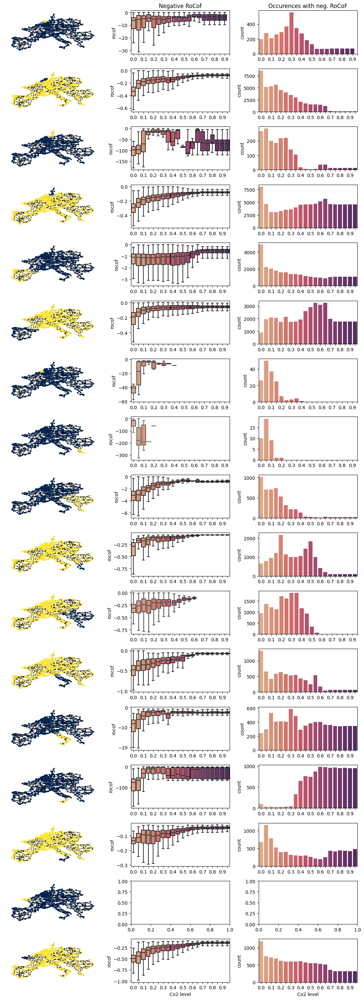

In [22]:

plt.clf()
n_col = 3
co2l_colors = plt.get_cmap('cividis')(range(co2ls.size))
fig, ax = plt.subplots(n_selected_cluster, n_col, figsize=(11,30))

co2ls_labels = [level.round(2) if i%2==0 else '' for i, level in enumerate(co2ls)]
co2ls_colors = dict(zip(co2ls.round(2), sns.color_palette('flare', co2ls.size)))
for ax_row, label in enumerate(selected_cluster):
    
    
    # split map
    visualisation.plot_component_cluster(indicator_vectors[component_props.cluster_label==label],
                                         [ax[ax_row, 0]],
                                         component_props[component_props.cluster_label==label].cluster_label.values,
                                         '',
                                         G,
                                         5)
    
    data = component_props[(component_props.cluster_label==label) & (component_props.rocof<=0)]
    
        
    # rocof
    try:
        sns.boxplot(data=data,
                    x='co2l', y='rocof', ax=ax[ax_row, 1], showfliers=False, palette=co2ls_colors)
        ax[ax_row, 1].set_xlabel('')
        ax[ax_row, 1].set_xticks(range(co2ls.size))
        ax[ax_row, 1].set_xticklabels(co2ls_labels)
    except:
        continue
    
    # likelihood
    
    sns.countplot(data = data ,
                  x = 'co2l', ax=ax[ax_row, 2], palette=co2ls_colors)
    ax[ax_row, 2].set_xlabel('')
    ax[ax_row, 2].set_xticks(range(co2ls.size))
    ax[ax_row, 2].set_xticklabels(co2ls_labels)
    
ax[-1,1].set_xlabel('Co2 level')
ax[-1,2].set_xlabel('Co2 level')
ax[0,1].set_title('Negative RoCof')
ax[0,2].set_title('Occurences with neg. RoCoF')
plt.tight_layout()
plt.savefig('./splits_cluster_neg_rocof_boxplots.pdf', dpi=200, bbox_inches='tight')

plt.show()

In [35]:
plt.figure(figsize=(20,8))
sns.boxplot(data=selected_components[selected_components.rocof_positive], x='co2l', y='rocof', hue='cluster_label', showfliers=False)
plt.legend(ncol=2)
#plt.xlim([-0.5,6])
plt.yscale('log') 
plt.show()

NameError: name 'selected_components' is not defined

In [ ]:
f,ax = plt.subplots(figsize=(12,10))

colors = sns.color_palette('colorblind')
print(colors)

sns.lineplot(data = cluster_props.loc[selected_cluster].reset_index() ,
             x = 'co2l',
             y = 'likelihood',
             hue = 'cluster_label',
             marker = '.', 
             ms = 10, 
             palette = 'colorblind')
#plt.yscale('log')
plt.legend(ncol=4)
plt.show()

In [ ]:
f,ax = plt.subplots(figsize=(12,10))

colors = sns.color_palette('colorblind')
print(colors)

sns.lineplot(data = cluster_props.loc[selected_cluster].reset_index() , 
             x = 'co2l', 
             y = 'median_neg_rocof', 
             hue = 'cluster_label', 
             marker = '.', 
             ms = 10, 
             palette = 'colorblind')#colors[:6])
#plt.yscale('log')


In [ ]:
f,ax = plt.subplots(3,5,figsize=(24,16))
maxval = int(3e5)#4e5
bins = np.arange(0,maxval,4000)

for count,label in enumerate(selected_cluster_labels.unique()):
    
    xcoord = int(count//5)
    ycoord = int(count%5)
    
    component_props[(component_props.cluster_label==label) & (component_props.co2l==0.05)].inertia_proxy.hist(log = True, 
                                                                                                             bins = bins, 
                                                                                                             ax = ax[xcoord,ycoord])
    ax[xcoord,ycoord].set_title(label,fontsize = 24)
    ax[xcoord,ycoord].tick_params(axis = 'both', which = 'both', labelsize = 24)
plt.tight_layout()
plt.show()

In [ ]:
f,ax = plt.subplots(3,5,figsize=(24,16))
maxval = int(3e5)#4e5
bins = np.arange(0,maxval,4000)

for count,label in enumerate(selected_cluster_labels.unique()):
    
    xcoord = int(count//5)
    ycoord = int(count%5)
    
    component_props[(component_props.cluster_label==label) & (component_props.co2l==0.5)].inertia_proxy.hist(log = True, 
                                                                                                             bins = bins, 
                                                                                                             ax = ax[xcoord,ycoord])
    ax[xcoord,ycoord].set_title(label,fontsize = 24)
    ax[xcoord,ycoord].tick_params(axis = 'both', which = 'both', labelsize = 24)
plt.tight_layout()

In [ ]:
f,ax = plt.subplots(figsize=(20,8))
maxval = int(1e2)#4e5
bins = np.arange(-maxval,0,0.5) 
for label in np.unique(selected_cluster_labels):
    component_props[(component_props.cluster_label==label) & (component_props.co2l==0.1)].rocof.hist(log = True, 
                                                                                                bins = bins, 
                                                                                                ax = ax,
                                                                                                alpha = .5,
                                                                                                label = label) 
#ax.set_title(label,fontsize = 24)
ax.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax.legend(fontsize = 20)
plt.tight_layout()
plt.show()

In [ ]:
f,ax = plt.subplots(3,5,figsize=(24,16))
maxval = int(3e5)#4e5
bins = np.arange(0,maxval,4000)

for count,label in enumerate(selected_cluster_labels.unique()):
    
    xcoord = int(count//5)
    ycoord = int(count%5)
    
    component_props[(component_props.cluster_label==label) & (component_props.co2l==0.9)].inertia_proxy.hist(log = True, 
                                                                                                             bins = bins, 
                                                                                                             ax = ax[xcoord,ycoord])
    ax[xcoord,ycoord].set_title(label,fontsize = 24)
    ax[xcoord,ycoord].tick_params(axis = 'both', which = 'both', labelsize = 24)
plt.tight_layout()

## Visualise in likelihoode <-> rocof space

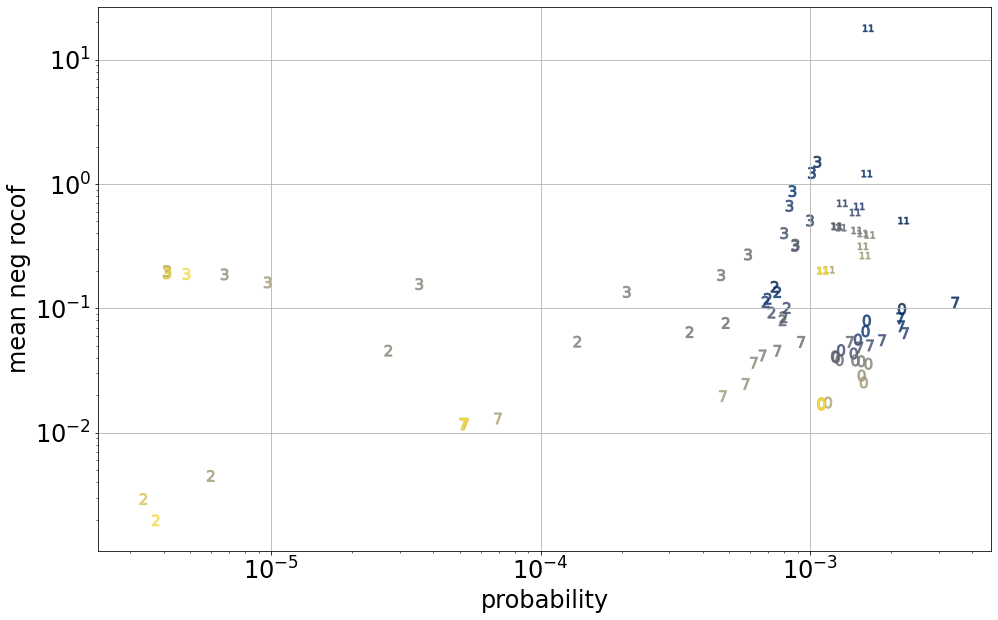

In [137]:
cmap = plt.get_cmap('cividis')
colors = [cmap(i/points.shape[0]) for i in range(points.shape[0])]
f,ax = plt.subplots(figsize = (16,10))
ax.grid(True)
indices = cluster_props.loc[selected_cluster].index.get_level_values(0).unique()


for i in range(5):
    
    points = np.array([cluster_props.loc[selected_cluster].loc[indices[i]]['likelihood'],cluster_props.loc[selected_cluster].loc[indices[i]]['mean_neg_rocof']]).T

    
    ax.scatter(points[:, 0], 
                points[:, 1],
               c = colors,
               s = 500,
               alpha = 0.7,
               marker =  TextPath((0,0), str(indices[i])),#str(indices[i]),
               label = indices[i])#, points[1:, 0]-points[:-1, 0], points[1:, 1]-points[:-1, 1])
ax.set_yscale('log')    
ax.set_xscale('log')    
ax.set_xlabel('probability', fontsize = 24)
ax.set_ylabel('mean neg rocof', fontsize = 24)
ax.tick_params(axis = 'both', which = 'both', labelsize = 24)

#ax.legend(fontsize = 24)

In [ ]:
cmap = plt.get_cmap('cividis')

f,ax = plt.subplots(figsize = (16,10))

ax.grid(True)

indices = cluster_props.loc[selected_cluster].index.get_level_values(0).unique()

colors_points = sns.color_palette('colorblind')

print(colors_points)

for i,cluster in enumerate(selected_cluster[:10]):
    
    points = np.array([cluster_props.loc[selected_cluster].loc[indices[i]]['likelihood'],
                       cluster_props.loc[selected_cluster].loc[indices[i]]['max_neg_rocof']]).T##mean_neg_rocof

    
    colors = [cmap(i/len(co2ls)) for i in range(len(co2ls)-1)]

    ax.scatter(points[:, 0], 
               points[:, 1],
               s = 200, 
               color = colors_points[i],
              label = cluster)
    
    ax.quiver(points[1:, 0][::-1], points[1:, 1][::-1],
          (points[:-1, 0]-points[1:,0])[::-1],
          (points[:-1, 1]-points[1:,1])[::-1],
          angles = 'xy', 
          scale_units = 'xy',
          scale = 1,
          width = 0.004,
         color = colors)
    
    print(cluster)
ax.set_yscale('log')    
ax.set_xscale('log')    
ax.set_xlabel('probability', fontsize = 24)
ax.set_ylabel('mean neg rocof', fontsize = 24)
ax.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax.legend(fontsize = 24)
plt.show()

In [ ]:
## cmap = plt.get_cmap('cividis')

f,ax = plt.subplots(figsize = (16,10))

ax.grid(True)

indices = cluster_props.loc[selected_cluster].index.get_level_values(0).unique()

cmap = plt.get_cmap('magma_r')

colors_points = [cmap(i/(len(selected_cluster)+2)) for i in range(len(selected_cluster))]#sns.color_palette('colorblind')


start_index = 6

cmap = plt.get_cmap('cividis')

for i,cluster in enumerate(selected_cluster[:start_index+1]):#enumerate(selected_cluster[start_index:start_index+1],start_index):
    
    points = np.array([cluster_props.loc[selected_cluster].loc[indices[i]]['likelihood'],
                       cluster_props.loc[selected_cluster].loc[indices[i]]['median_neg_rocof']]).T##mean_neg_rocof

    
    colors = [cmap(i/len(co2ls)) for i in range(len(co2ls)-1)][::-1]

    ax.scatter(points[:, 0], 
               points[:, 1],
               s = 200, 
               color = colors_points[i],
              label = cluster,
              alpha = 0.8)
    yerr = np.array([cluster_props.loc[selected_cluster].loc[indices[i]]['upper_quantile_neg_rocof'],
                     cluster_props.loc[selected_cluster].loc[indices[i]]['lower_quantile_neg_rocof']])
    #print(yerr)
    ax.errorbar(points[:, 0],
                 points[:, 1], 
                 yerr = yerr, 
                 fmt = 'o',
                color = colors_points[i],
               capsize = 10)
    
    ax.quiver(points[1:, 0][::-1], points[1:, 1][::-1],
          (points[:-1, 0]-points[1:,0])[::-1],
          (points[:-1, 1]-points[1:,1])[::-1],
          angles = 'xy', 
          scale_units = 'xy',
          scale = 1,
          width = 0.003,# 0.004,
         color = colors)
    
    print(cluster)
ax.set_yscale('log')    
ax.set_xscale('log')    
ax.set_xlabel('probability', fontsize = 24)
ax.set_ylabel('neg rocof', fontsize = 24)
ax.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax.legend(fontsize = 24)
plt.show()

## Summary plot

0 3.0
3.0
1 26.0
26.0
2 48.0
48.0
3 19.0
19.0
4 7.0
7.0
5 28.0
28.0
6 18.0
18.0


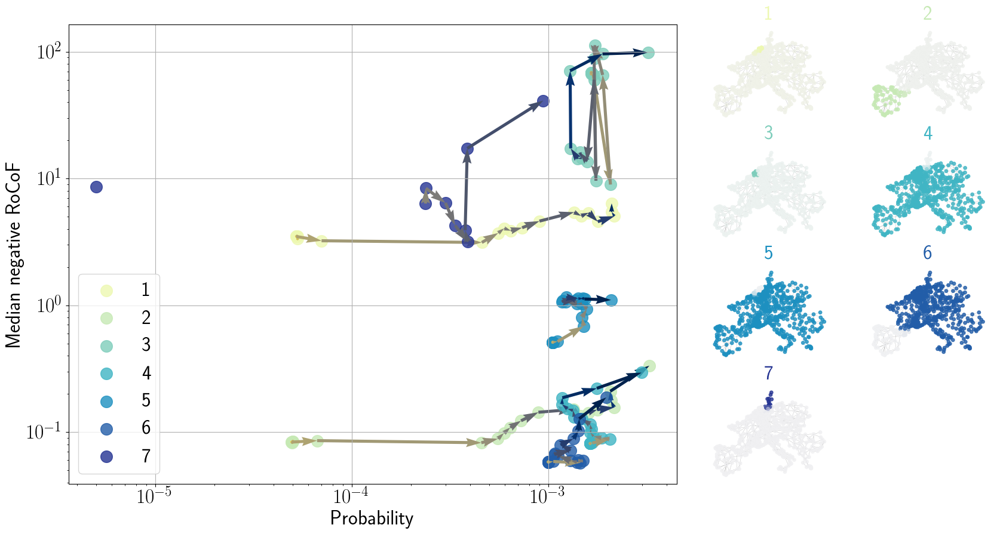

In [34]:
selected_ind_vectors = indicator_vectors[component_props.cluster_label.isin(selected_cluster)]
selected_cluster_labels = component_props[component_props.cluster_label.isin(selected_cluster)].cluster_label


## cmap = plt.get_cmap('cividis')
plt.rc('text', usetex = True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

f = plt.figure(figsize = (20,10))

gs = GridSpec(4, 6, figure = f)

axs = []

for i in range(4):
    axs.append([])
    for j in range(2):
        axs[i].append(f.add_subplot(gs[i, j+4]))
        axs[i][j].axis('off')
        
ax = f.add_subplot(gs[:,:4])


ax.grid(True)

indices = cluster_props.loc[selected_cluster].index.get_level_values(0).unique()

from palettable.cartocolors.sequential import agSunset_7
from palettable.colorbrewer.sequential import YlGnBu_9

cmap = YlGnBu_9.mpl_colormap#agSunset_7.mpl_colormap #Solar_3.mpl_colormap

colors_points = [cmap((i+1)/(len(selected_cluster)+1)) for i in range(len(selected_cluster))]#sns.color_palette('colorblind')


start_index = 6


for i,cluster in enumerate(selected_cluster[:start_index+1]):#enumerate(selected_cluster[start_index:start_index+1],start_index):
    print(i,cluster)
    co2_cmap = plt.get_cmap('cividis')
    points = np.array([cluster_props.loc[indices[i]]['likelihood'],
                       cluster_props.loc[indices[i]]['median_neg_rocof']]).T###['mean_neg_rocof']]).T#
    
    colors = [co2_cmap(i/len(co2ls)) for i in range(len(co2ls)-1)][::-1]

    ax.scatter(points[:, 0], 
               points[:, 1],
               s = 200, 
               color = colors_points[i],
              label = str(i+1),#cluster,
              alpha = 0.8)
    yerr = np.array([cluster_props.loc[indices[i]]['upper_quantile_neg_rocof'],
                     cluster_props.loc[indices[i]]['lower_quantile_neg_rocof']])
    #print(yerr)
    #ax.errorbar(points[:, 0],
    #             points[:, 1], 
    #             yerr = yerr, 
    #             fmt = 'o',
    #            color = colors_points[i],
    #           capsize = 10)
    
    ax.quiver(points[1:, 0][::-1], points[1:, 1][::-1],
          (points[:-1, 0]-points[1:,0])[::-1],
          (points[:-1, 1]-points[1:,1])[::-1],
          angles = 'xy', 
          scale_units = 'xy',
          scale = 1,
          width = 0.005,# 0.004,
         color = colors)
    
    print(cluster)
ax.set_yscale('log')    
ax.set_xscale('log')    
ax.set_xlabel('Probability', fontsize = 24)
ax.set_ylabel('Median negative RoCoF', fontsize = 24)
ax.tick_params(axis = 'both', which = 'both', labelsize = 24)#
ax.legend(fontsize = 24)

#########################################

    
node_positions = nx.get_node_attributes(G,'pos')
    
sorted_labels = np.unique(selected_cluster_labels.values)
for i, label in enumerate(sorted_labels):
    xcoord = int(i//2)
    ycoord = int(i%2)
    cmap2 = sns.light_palette(cmap((i+1)/(len(selected_cluster)+1)), as_cmap=True)
    
    mean_ind_vector = np.array([selected_ind_vectors[selected_cluster_labels.values == label].mean(0) ])

    nx.draw(G,
            pos = node_positions,
            node_size = 15,
            width = 0.1,
            alpha = 0.8,
            ax = axs[xcoord][ycoord],
            node_color = mean_ind_vector,
            cmap = cmap2,
            vmin = 0,
            vmax = 1)


    axs[xcoord][ycoord].set_title('{}'.format(str(i+1)), #label
                                  fontsize = 24,
                                 color = cmap((i+1)/(len(selected_cluster)+1)))

path = '/media/fkaiser/'
save_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'

#plt.savefig(save_path+'Figures/Figure6_risk_probability_plot.pdf',bbox_inches = 'tight')
plt.savefig('./Figure6_risk_probability_plot.pdf', dpi=200, bbox_inches='tight')

plt.show()

## Analyse correlation with generation

In [676]:
component_props["co2l_str"] = component_props["co2l"].apply(lambda x: '{0:.2f}'.format(x)).astype(str)

In [727]:
correlations = pd.DataFrame(index = pd.MultiIndex.from_product([selected_cluster,['{0:.2f}'.format(co2ls[i]) for i in range(len(co2ls))]],
                                                                names = ["cluster", "co2l"]),
                           columns = network.generators.carrier.unique())

In [ ]:
for i,co2l in enumerate(co2ls):
    network = pypsa.Network()
    network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{np.round(co2l,2)}-3H.nc') 
    
    G = utils.build_networkx_graph(network, snet_index = snet_index)
    
    co2lstr = '{0:.2f}'.format(co2l)
    print(co2lstr)
    for count,label in enumerate(selected_cluster):
        cluster_probability = component_props[component_props.cluster_label == label].groupby(['co2l_str','time_stamp']).size().to_frame('counts')
        current_probs = cluster_probability.loc[co2lstr]
        current_probs.index = current_probs.index.map(lambda x: utils.solution_key_to_pandas_timestamp(x))

        gens = network.generators[network.generators["bus"].isin(list(G.nodes()))]
        current_generation = network.generators_t.p.T.loc[list(gens.index)].groupby(gens["carrier"]).sum().T
        current_generation = current_generation.add(current_probs,fill_value = 0)
        correlations.loc[(label,co2lstr)] = current_generation.corr().loc['counts']


In [748]:
# Example of making your own norm.  Also see matplotlib.colors.
# From Joe Kington: This one gives two different linear ramps:
class MidpointNormalize(mplcolors.Normalize):
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        mplcolors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))

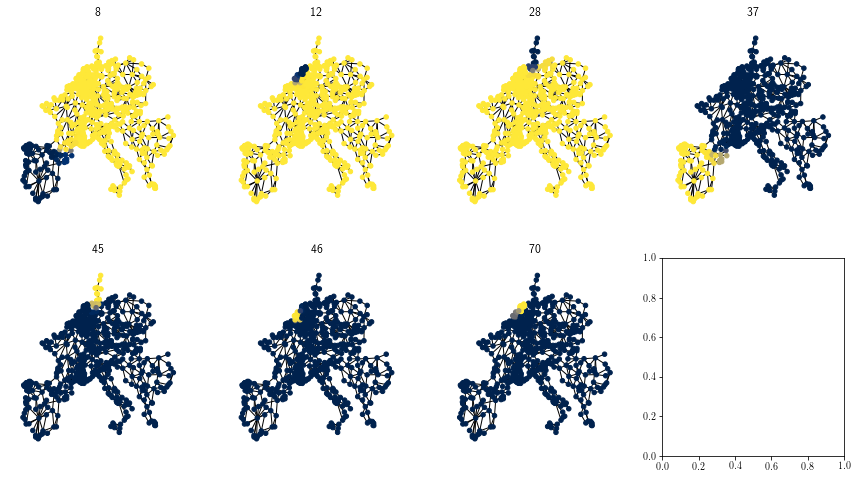

In [756]:
# Plot mean component vector of selected (cluster, co2l) samples
# (Does this make sense to only average over selected tuples?)

n_cols = 4 # adapt this value!

n_rows = np.ceil(n_selected_cluster/n_cols).astype(int)
fig,ax = plt.subplots(n_rows,n_cols,figsize = (15,4*n_rows))

#selected_components_mask = pd.MultiIndex.from_frame(component_props.loc[:,['cluster_label', 'co2l']]).isin(selected_cluster)
#selected_cluster_labels = component_props[selected_components_mask].cluster_label
#selected_ind_vectors = indicator_vectors[selected_components_mask]

selected_ind_vectors = indicator_vectors[component_props.cluster_label.isin(selected_cluster)]
selected_cluster_labels = component_props[component_props.cluster_label.isin(selected_cluster)].cluster_label

visualisation.plot_component_cluster(selected_ind_vectors,
                                     ax.flatten()[:n_selected_cluster],
                                     selected_cluster_labels.values,
                                     None,
                                     G)

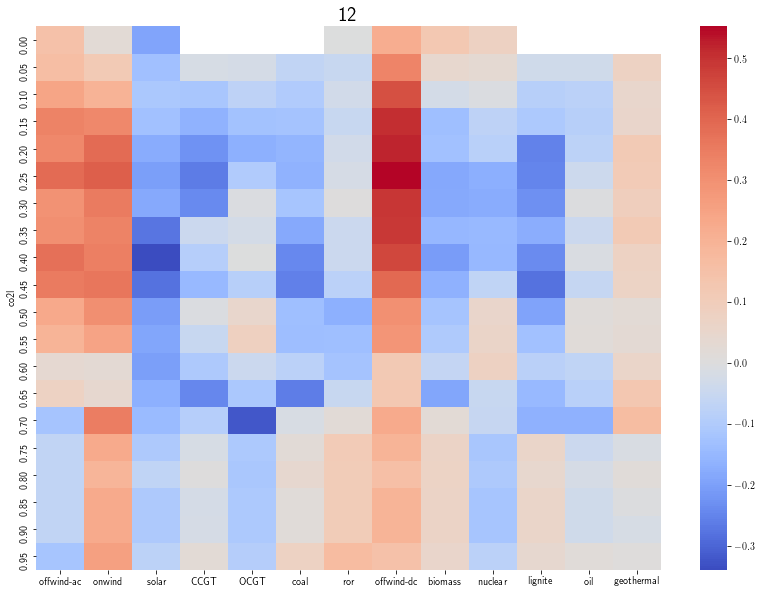

In [771]:
### correlation over time with total generation by type and frequency of occurence of a given split

current_cluster = selected_cluster[1]
test_df = (correlations.loc[current_cluster].copy()).astype("float")

vmin = test_df.min().min()
vmax = test_df.max().max()

norm = MidpointNormalize(midpoint = 0, vmin = vmin, vmax = vmax)  

f,ax = plt.subplots(figsize=(14,10))
sns.heatmap(data = test_df,
            norm = norm,
            cmap = plt.get_cmap('coolwarm'),
            ax = ax)
ax.set_title(current_cluster,fontsize = 20)
plt.show()